# Installing the package

Uncomment this line to download the package. For best results, install PyVaR in a fresh Python environment to avoid conflicts with existing packages.

In [1]:
#pip install git+https://github.com/Alessandro-Dodon/pyvar.git#subdirectory=package

---

## Notebook Overview

This notebook is dedicated to **VaR estimation based on volatility modeling**, where we move beyond the strong i.i.d. assumption of earlier methods.

We still focus on **univariate models**, typically applied to a single asset or asset class. We are not yet modeling full portfolios or return correlations across assets — each model treats returns as a standalone time series.

The key idea is to allow volatility to vary over time. We begin with simple approaches like **Moving Average (MA)** and **Exponentially Weighted Moving Average (EWMA)**, then progress to more flexible models from the **GARCH family**. These models capture volatility clustering and persistence — key features of real financial data.

For each method, we estimate time-varying volatility and compute VaR dynamically, showing how the model adapts to changing market conditions.


### Packages

We begin by importing the `pyvar` package along with other necessary libraries for data handling, analysis, and visualization. Ensure all required packages are installed in your environment before proceeding.

In [2]:
import pyvar as pv

In [3]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
import seaborn as sns
from matplotlib.ticker import FuncFormatter

---

### Choosing a Single Asset Portfolio

We begin with basic VaR models using a single asset: the S&P 500 index (^GSPC). The S&P 500 is the most widely followed benchmark of U.S. equities and is often used as a representative proxy for the overall stock market.

While these models are univariate—meaning they analyze one asset at a time—you can apply them to your own portfolio by first computing daily portfolio returns. This is done by summing the monetary positions across assets for each day, then calculating the daily return series.

Note: All our models here use **daily data**.

Feel free to replace the ticker with another asset of interest. Popular choices include:
- Vanguard Total World Stock ETF (`VT`)
- Apple (`AAPL`)
- Nvidia (`NVDA`)
- Microsoft (`MSFT`)
- Tesla (`TSLA`)

In [4]:
# Download the S&P 500 data from YF
sp_data = yf.download("^GSPC", start="2000-01-01", end="2025-01-01")

# Check for missing values in the entire DataFrame (including the new column)
print(sp_data.isnull().sum())

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  1 of 1 completed

Price   Ticker
Close   ^GSPC     0
High    ^GSPC     0
Low     ^GSPC     0
Open    ^GSPC     0
Volume  ^GSPC     0
dtype: int64


In [5]:
# Compute log returns and remove the first NaN
sp_data["Log Returns"] = np.log(sp_data["Close"] / sp_data["Close"].shift(1))
sp_returns = sp_data["Log Returns"].dropna()

In [6]:
sp_returns.head()

Date
2000-01-04   -0.039099
2000-01-05    0.001920
2000-01-06    0.000955
2000-01-07    0.026730
2000-01-10    0.011128
Name: Log Returns, dtype: float64

If you want to **download and save the return series as a CSV**, you can do:

```python
sp_returns.to_csv("sp_returns.csv")
```

If you want to **load your own return series from a CSV**, use:

```python
sp_returns = pd.read_csv("your_file.csv", index_col=0, parse_dates=True).squeeze()
```

Make sure:
- The CSV contains one column of daily return values
- The first column becomes the date index
- Dates are properly parsed for the analysis
- Returns are already computed (not prices)

Note: You are responsible for return calculation and data cleaning.  

#### General Setup

We will always use a 99% confidence level, but feel free to experiment with 95% or 97.5%. We will start with investing $100K.

In [7]:
# Set parameters
confidence_level = 0.99 # <----- Can choose 0.95 etc
wealth = 100_000 # <----- Wealth invested in our Asset

---

### Moving Average (MA) Volatility

We start with the simplest method for modeling volatility: the **Moving Average (MA)** of past squared returns. This approach assumes constant variance over a rolling window, smoothing out recent fluctuations.

The **MA volatility estimate** over a window of $n$ days is:

$$
\sigma_t^2 = \frac{1}{n} \sum_{i=1}^h r_{t-i}^2
$$

This method is easy to compute and interpret. For example, a 60-day window provides a balance between smoothing and responsiveness. However, it gives **equal weight** to all observations within the window and **drops older data abruptly**, which can limit its ability to adapt to recent market changes.

The resulting volatility estimate is then used to compute daily VaR:

$$
\text{VaR}_t = - \sigma_t \cdot z_\alpha
$$

To estimate $z_\alpha$, we always use a **semi-empirical** approach: we divide the returns by the fitted volatility (to extract standardized innovations) and use their empirical quantile, which better captures asymmetry and fat tails. This also allows a simple and closed form expression for ES, which is our standard for volatility models:

$$
    \mathrm{ES}_{t} = -\sigma_t \, \mathbb{E}[z_t \mid z_t < z_\alpha],
$$

While MA is a useful baseline, it does not capture volatility clustering or memory effects well.


In [8]:
# Apply MA volatility model
ma_results, next_day_ma_var = pv.ma_var(sp_returns, confidence_level, window=60, wealth=wealth) 

print(f"Next-day MA VaR estimate: ${next_day_ma_var:.2f}")

# Compute ES for the whole period
ma_results = pv.volatility_es(ma_results, confidence_level, wealth=wealth)

Next-day MA VaR estimate: $2286.94



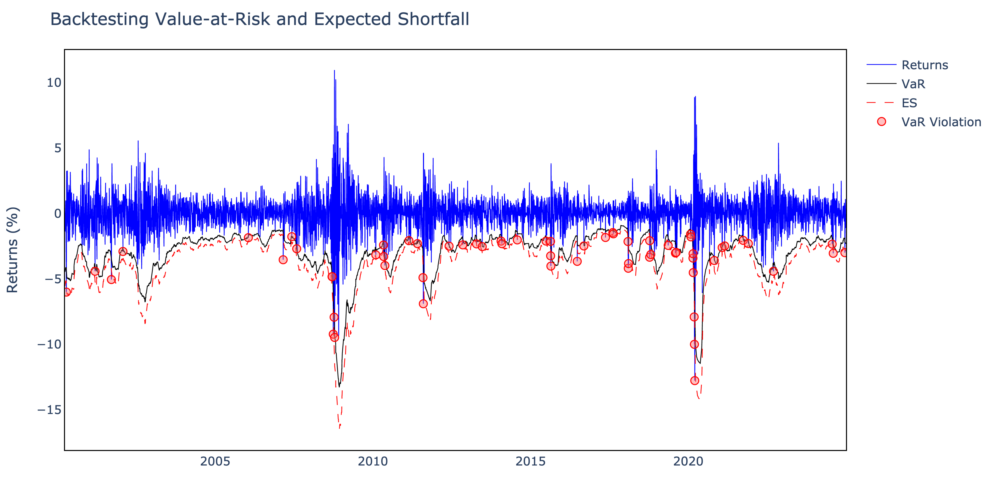

In [9]:
# Plot full backtest 
pv.plot_backtest(ma_results, interactive=False) 

From now on, plots will always be shown for a high-volatility subset.


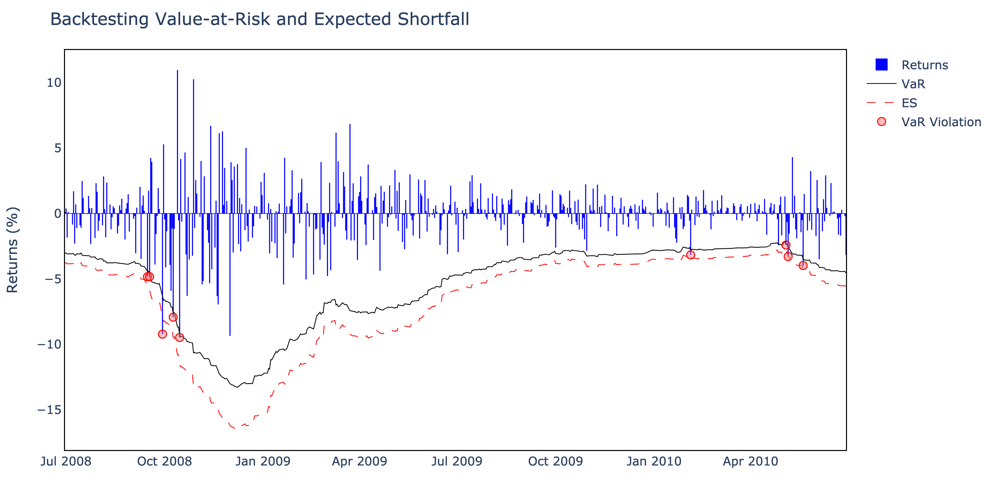

In [10]:
# Plot backtest 
pv.plot_backtest(ma_results, subset=("2008-06-29","2010-06-29"), interactive=False) 


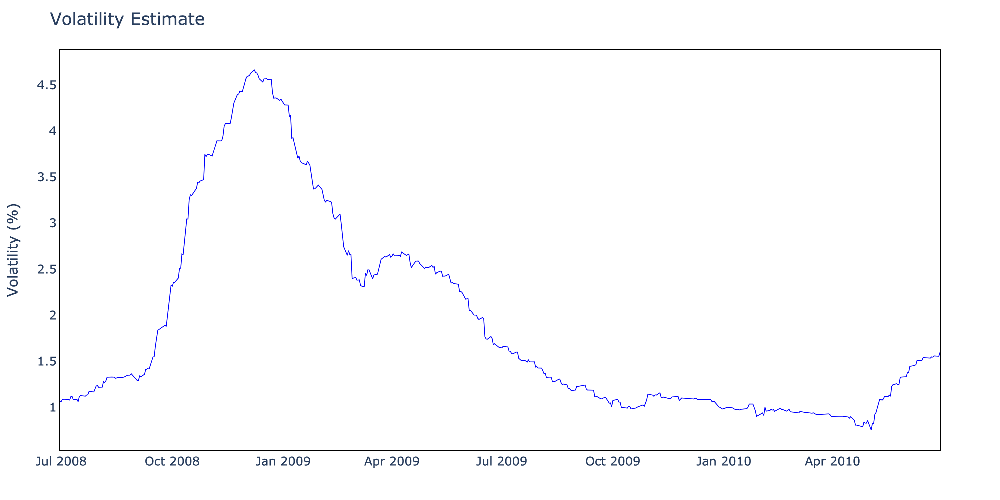

In [11]:
# Plot volatility 
pv.plot_volatility(ma_results["Volatility"], subset=("2008-06-29","2010-06-29"), interactive=False)

#### Backtesting MA

Notice how, with the inclusion of volatility models, all backtesting tests are generally passed—even when using the simplest MA specification. This highlights the importance of accounting for time-varying volatility, even with minimal structure.

The backtesting always refers to the full period, not just the subset shown above.

In [12]:
# Count violations
ma_violations, ma_violation_rate = pv.count_violations(ma_results)

# Kupiec Test (Unconditional Coverage)
ma_kupiec = pv.kupiec_test(
    total_violations=ma_violations,
    total_days=len(ma_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
ma_christoffersen = pv.christoffersen_test(ma_results)

# Joint Test (Conditional Coverage)
ma_joint = pv.joint_lr_test(
    LR_uc=ma_kupiec["LR_uc"],
    LR_c=ma_christoffersen["LR_c"]
)

In [13]:
# Summary output
print(f"\n--- MA VaR Backtesting Summary (60-day window) ---")
print(f"Total Violations     : {ma_violations}")
print(f"Violation Rate       : {ma_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {ma_kupiec['LR_uc']:.4f}")
print(f"p-value             : {ma_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {ma_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {ma_christoffersen['LR_c']:.4f}")
print(f"p-value             : {ma_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {ma_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {ma_joint['LR_total']:.4f}")
print(f"p-value             : {ma_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {ma_joint['reject_null']}")



--- MA VaR Backtesting Summary (60-day window) ---
Total Violations     : 63
Violation Rate       : 1.01%

Kupiec Test (UC):
LR_uc               : 0.0081
p-value             : 0.9281
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 12.5026
p-value             : 0.0004
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 12.5108
p-value             : 0.0019
Reject Null (5%)    : True


---

### Exponentially Weighted Moving Average (EWMA)

To improve on the basic MA, we use **Exponentially Weighted Moving Average (EWMA)**, which applies decaying weights to past squared returns:

$$
\sigma_t^2 = (1 - \lambda) \sum_{i=1}^{\infty} \lambda^{i-1} r_{t-i}^2
$$

Here, $\lambda \in (0, 1)$ is the **decay factor**. A typical value is $\lambda = 0.94$ (used by RiskMetrics™), which gives more weight to recent returns.

Unlike MA, EWMA **does not drop** any data completely — the influence of past returns fades smoothly over time. The VaR formula remains the same:

$$
\text{VaR}_t = - \sigma_t \cdot z_\alpha
$$

This method is still simple and fast to compute, and it reacts more efficiently to shocks than a fixed-window MA.

The plot below shows how different values of $\lambda$ affect the **decay pattern of EWMA weights**, emphasizing how recent observations are weighted more heavily in volatility estimation.


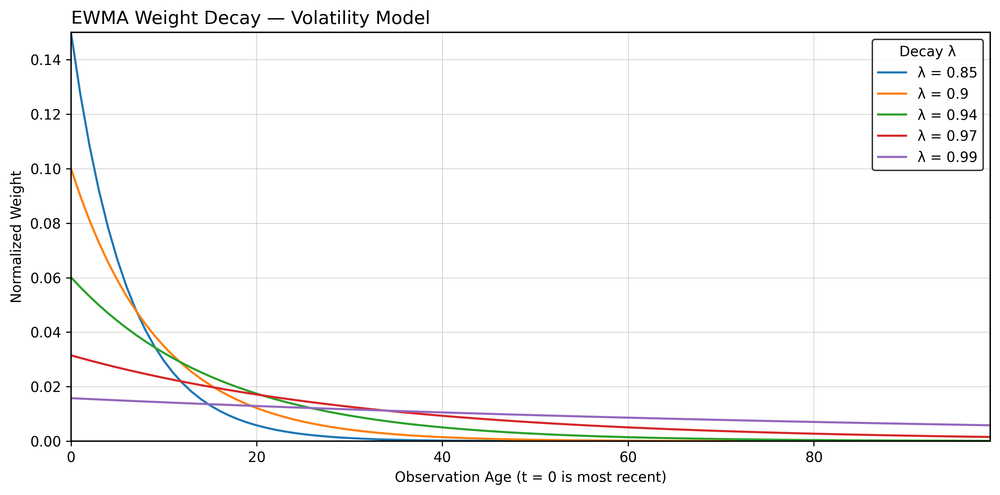

In [14]:
# Settings
num_observations = 100
observation_range = np.arange(num_observations)
lambda_values = [0.85, 0.90, 0.94, 0.97, 0.99]

# Compute EWMA weights for each lambda (classic form, not rescaled like Hybrid VaR)
weight_matrix = {}
for lambda_decay in lambda_values:
    raw_weights = (1 - lambda_decay) * lambda_decay**observation_range
    normalized_weights = raw_weights / raw_weights.sum()
    weight_matrix[lambda_decay] = normalized_weights

# Plot
plt.figure(figsize=(10, 5), dpi=300)

for lambda_decay, weights in weight_matrix.items():
    plt.plot(observation_range, weights, label=f"λ = {lambda_decay}")

# Title and labels
plt.title("EWMA Weight Decay — Volatility Model", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Observation Age (t = 0 is most recent)")
plt.ylabel("Normalized Weight")

# Black box styling
ax = plt.gca()
for side in ['top', 'bottom', 'left', 'right']:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')

# Remove white space at the ends
ax.set_xlim(observation_range.min(), observation_range.max())
ax.set_ylim(0, max(max(w) for w in weight_matrix.values()))

# Grid and legend
plt.grid(True, linewidth=0.3)
plt.legend(title="Decay λ", frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()


In [63]:
# Apply EWMA volatility model
ewma_results, next_day_ewma_var = pv.ewma_var(sp_returns, confidence_level, lambda_decay=0.94, wealth=wealth) 

print(f"Next-day EWMA VaR estimate: ${next_day_ewma_var:.2f}")

# Compute ES for the whole period
ewma_results = pv.volatility_es(ewma_results, confidence_level, wealth=wealth)

Next-day EWMA VaR estimate: $2122.72



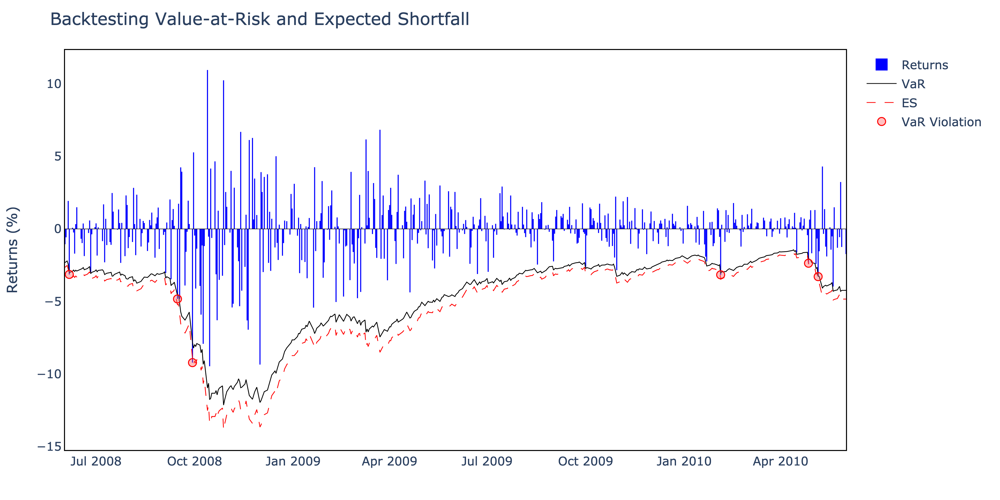

In [64]:
# Plot backtest 
pv.plot_backtest(ewma_results, subset=("2008-06-01","2010-06-01"), interactive=False) 


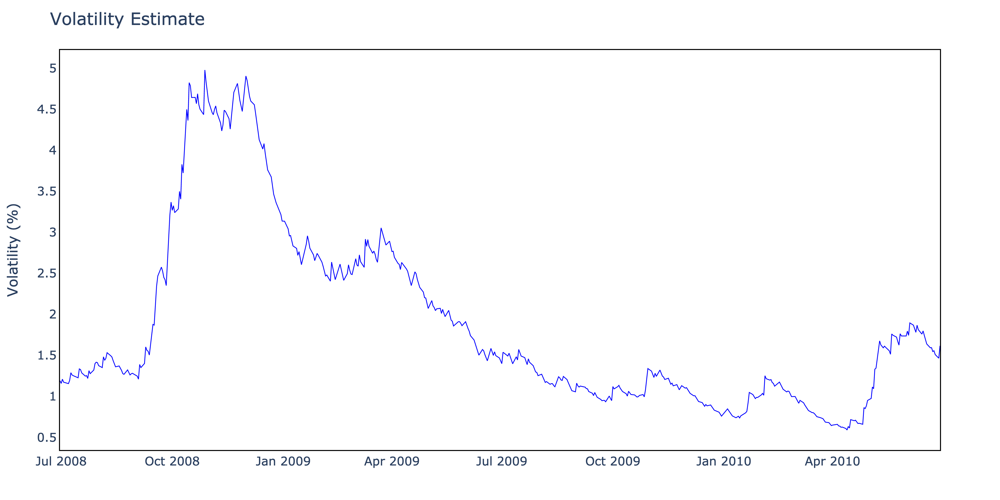

In [17]:
# Plot volatility 
pv.plot_volatility(ewma_results["Volatility"], subset=("2008-06-29","2010-06-29"), interactive=False)

#### Backtesting EWMA

In [18]:
# Count violations
ewma_violations, ewma_violation_rate = pv.count_violations(ewma_results)

# Kupiec Test (Unconditional Coverage)
ewma_kupiec = pv.kupiec_test(
    total_violations=ewma_violations,
    total_days=len(ewma_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
ewma_christoffersen = pv.christoffersen_test(ewma_results)

# Joint Test (Conditional Coverage)
ewma_joint = pv.joint_lr_test(
    LR_uc=ewma_kupiec["LR_uc"],
    LR_c=ewma_christoffersen["LR_c"]
)

In [19]:
# Summary output
print(f"\n--- EWMA VaR Backtesting Summary (λ = 0.94) ---")
print(f"Total Violations     : {ewma_violations}")
print(f"Violation Rate       : {ewma_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {ewma_kupiec['LR_uc']:.4f}")
print(f"p-value             : {ewma_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {ewma_christoffersen['LR_c']:.4f}")
print(f"p-value             : {ewma_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {ewma_joint['LR_total']:.4f}")
print(f"p-value             : {ewma_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {ewma_joint['reject_null']}")


--- EWMA VaR Backtesting Summary (λ = 0.94) ---
Total Violations     : 63
Violation Rate       : 1.00%

Kupiec Test (UC):
LR_uc               : 0.0002
p-value             : 0.9879
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 4.7973
p-value             : 0.0285
Reject Null (5%)    : True

Joint Test (Conditional Coverage):
LR_total            : 4.7975
p-value             : 0.0908
Reject Null (5%)    : False


---

### GJR-GARCH with Skewed-t Innovations

We now adopt a more complex volatility model: **GJR-GARCH**, which extends the basic GARCH(1,1) by introducing **asymmetry** — the so-called **leverage effect**, where negative returns increase volatility more than positive ones.

The model for conditional variance is:

$$
\sigma_{t}^{2} = \omega 
+ \sum_{i=1}^{q} \alpha_{i} \, r_{t-i}^{2} 
+ \sum_{j=1}^{p} \beta_{j} \, \sigma_{t-j}^{2} 
+ \sum_{i=1}^{q} \gamma_{i} \, r_{t-i}^{2} \, \mathbb{I}_{\{r_{t-i}<0\}}
$$

With the estimated volatility ${\sigma}_t$, we compute the VaR as:

$$
\text{VaR}_t = - \sigma_t \cdot z_\alpha
$$

We also allow for different distributions when estimating GARCH models. In this example, we use the **skewed Student-t distribution**, which is fitted via maximum likelihood and helps account for both asymmetry and heavy tails — properties often observed in financial return series.

This approach — GARCH models combined with flexible distributions — is one of the most widely used by risk managers in practice. Feel free to experiment with our other volatility models, like APARCH or EGARCH.

Note: Since volatility is **time-varying**, you **cannot scale VaR by $\sqrt{h}$**. For longer horizons, use our forecasting functions instead.

In [20]:
# Apply GARCH volatility model
garch_results, next_day_var = pv.garch_var(sp_returns, confidence_level, model="GJR", distribution="skewt", wealth=wealth) # <----- Can choose "APARCH" etc

print(f"Next-day GARCH VaR estimate: ${next_day_var:.2f}")

# Compute ES for the whole period
garch_results = pv.volatility_es(garch_results, confidence_level, wealth=wealth)

Next-day GARCH VaR estimate: $3237.15



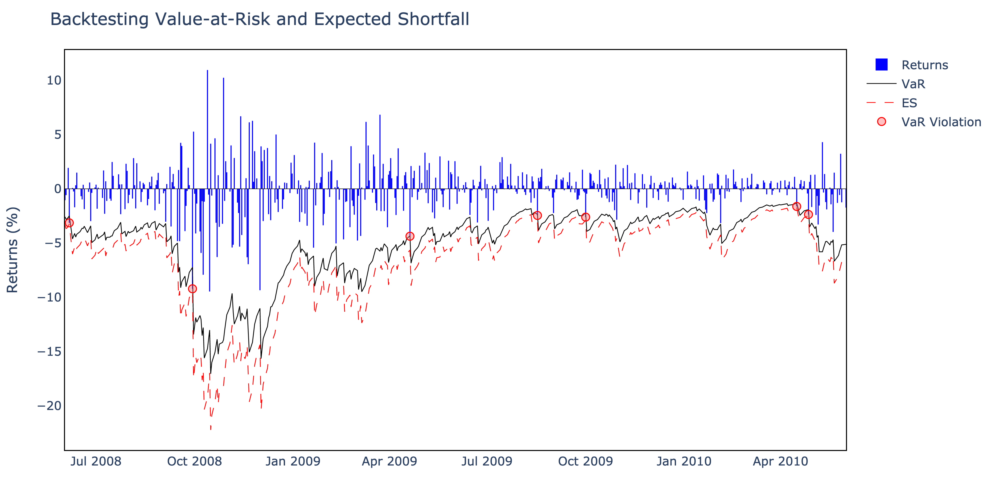

In [66]:
# Plot backtest 
pv.plot_backtest(garch_results, subset=("2008-06-01","2010-06-01"), interactive=False) 


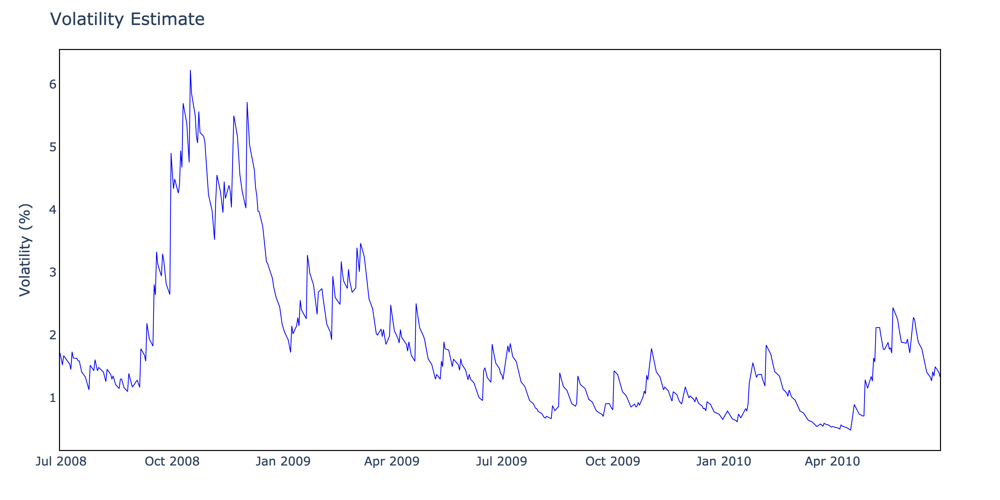

In [37]:
# Plot volatility 
pv.plot_volatility(garch_results["Volatility"], subset=("2008-06-29","2010-06-29"), interactive=False)

#### Backtesting GJR with Skewed-t Innovations

In [38]:
# Count violations
garch_violations, garch_violation_rate = pv.count_violations(garch_results)

# Kupiec Test (Unconditional Coverage)
garch_kupiec = pv.kupiec_test(
    total_violations=garch_violations,
    total_days=len(garch_results),
    confidence_level=confidence_level
)

# Christoffersen Test (Independence)
garch_christoffersen = pv.christoffersen_test(garch_results)

# Joint Test (Conditional Coverage)
garch_joint = pv.joint_lr_test(
    LR_uc=garch_kupiec["LR_uc"],
    LR_c=garch_christoffersen["LR_c"]
)

In [39]:
# Summary output
print(f"\n--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---")
print(f"Total Violations     : {garch_violations}")
print(f"Violation Rate       : {garch_violation_rate * 100:.2f}%\n")

print("Kupiec Test (UC):")
print(f"LR_uc               : {garch_kupiec['LR_uc']:.4f}")
print(f"p-value             : {garch_kupiec['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_kupiec['reject_null']}")

print("\nChristoffersen Test (Independence):")
print(f"LR_c                : {garch_christoffersen['LR_c']:.4f}")
print(f"p-value             : {garch_christoffersen['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_christoffersen['reject_null']}")

print("\nJoint Test (Conditional Coverage):")
print(f"LR_total            : {garch_joint['LR_total']:.4f}")
print(f"p-value             : {garch_joint['p_value']:.4f}")
print(f"Reject Null (5%)    : {garch_joint['reject_null']}")


--- GARCH VaR Backtesting Summary (GJR, skewed-t) ---
Total Violations     : 63
Violation Rate       : 1.00%

Kupiec Test (UC):
LR_uc               : 0.0002
p-value             : 0.9879
Reject Null (5%)    : False

Christoffersen Test (Independence):
LR_c                : 0.1869
p-value             : 0.6655
Reject Null (5%)    : False

Joint Test (Conditional Coverage):
LR_total            : 0.1872
p-value             : 0.9107
Reject Null (5%)    : False


#### Volatility Comparison

We compare the portfolio volatility estimated by our three models — **MA**, **EWMA**, and **GARCH**. The comparison is shown in two parts:

- The first plot covers the **full sample** period.
- The second zooms in on a **high-volatility episode (2008–2010)** to better observe differences in model responsiveness.

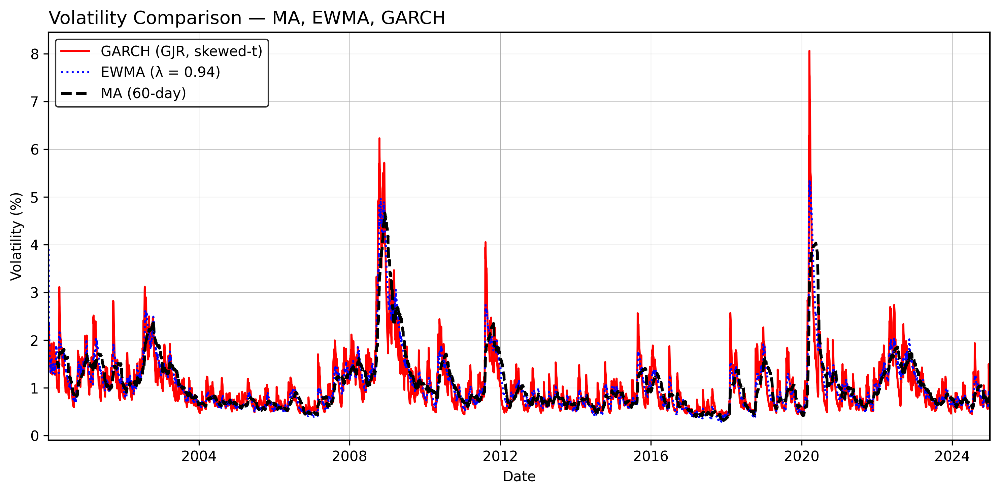

In [40]:
# Extract volatility series
vol_ma = ma_results["Volatility"]
vol_ewma = ewma_results["Volatility"]
vol_garch = garch_results["Volatility"]

# Plot
plt.figure(figsize=(10, 5), dpi=300)

# Plot GARCH first (red, solid)
plt.plot(vol_garch.index, 100 * vol_garch, label="GARCH (GJR, skewed-t)",
         color="red", linewidth=1.4, linestyle="-")

# Plot EWMA (blue, dotted)
plt.plot(vol_ewma.index, 100 * vol_ewma, label="EWMA (λ = 0.94)",
         color="blue", linewidth=1.4, linestyle=":")

# Plot MA last (black, dashed, bold)
plt.plot(vol_ma.index, 100 * vol_ma, label="MA (60-day)",
         color="black", linewidth=2.0, linestyle="--")

# Titles and labels
plt.title("Volatility Comparison — MA, EWMA, GARCH", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Date")
plt.ylabel("Volatility (%)")

# Axes styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')
plt.grid(True, linewidth=0.3)

# Remove white space only at the sides (x-axis)
all_indices = vol_ma.index.union(vol_ewma.index).union(vol_garch.index)
ax.set_xlim(all_indices.min(), all_indices.max())

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()


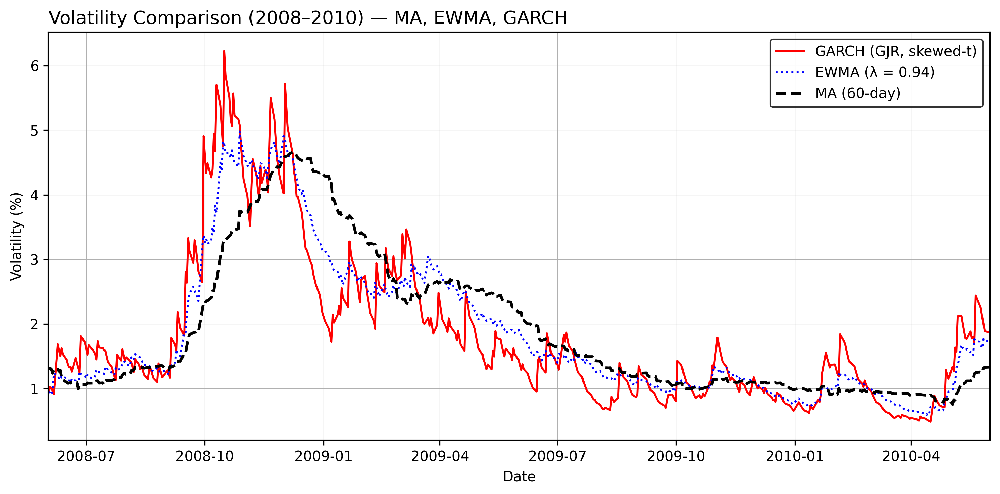

In [53]:
# Define date subset
start_date = "2008-06-01"
end_date = "2010-06-01"

# Slice volatility series
vol_ma_subset = vol_ma.loc[start_date:end_date]
vol_ewma_subset = vol_ewma.loc[start_date:end_date]
vol_garch_subset = vol_garch.loc[start_date:end_date]

# Plot
plt.figure(figsize=(10, 5), dpi=300)

# GARCH (red, solid)
plt.plot(vol_garch_subset.index, 100 * vol_garch_subset, label="GARCH (GJR, skewed-t)",
         color="red", linewidth=1.4, linestyle="-")

# EWMA (blue, dotted)
plt.plot(vol_ewma_subset.index, 100 * vol_ewma_subset, label="EWMA (λ = 0.94)",
         color="blue", linewidth=1.4, linestyle=":")

# MA (black, dashed, bold)
plt.plot(vol_ma_subset.index, 100 * vol_ma_subset, label="MA (60-day)",
         color="black", linewidth=2.0, linestyle="--")

# Titles and labels
plt.title("Volatility Comparison (2008–2010) — MA, EWMA, GARCH", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Date")
plt.ylabel("Volatility (%)")

# Axes styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')
plt.grid(True, linewidth=0.3)

# Remove white space only at the sides (x-axis)
all_indices = vol_ma_subset.index.union(vol_ewma_subset.index).union(vol_garch_subset.index)
ax.set_xlim(all_indices.min(), all_indices.max())

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()


---

### Volatility Forecasting with GARCH(1,1)

Once we fit a GARCH(1,1) model, we can use it to forecast future volatility and compute forward-looking VaR. These forecasts can be for a specific day ahead ($\tau$-step forecast) or cumulative over a given horizon ($T$-day total).

The GARCH(1,1) Variance Forecast (analytical) is computed as follows.

**Forecast for single-step variance $\tau$ steps ahead:**

$$
\mathbb{E}[\sigma_{t+\tau}^2] = \text{VL} + (a + b)^\tau \cdot (\sigma_t^2 - \text{VL})
$$

**Forecast for cumulative variance over $T$ days:**

$$
\mathbb{E}[\sigma_{t,T}^2] =
\text{VL} \cdot \left( T - 1 - \frac{(a + b)(1 - (a + b)^{T - 1})}{1 - (a + b)} \right)
+ \sigma_t^2 \cdot \frac{1 - (a + b)^T}{1 - (a + b)}
$$

Where:
- $\text{VL} = \dfrac{\omega}{1 - a - b}$ is the long-run variance  
- $\sigma_t^2$ is the last fitted conditional variance

Once variance is forecasted, the VaR over the chosen horizon is easily obtained using $z_\alpha$ as the quantile of the standardized innovations distribution.

In [42]:
# Define a setup
steps_list = [3, 10, 20] # <----- Can choose other values!
cumulative_list = [False, True]

print("\n--- GARCH(1,1) VaR Forecasts (99% Confidence) ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        var_estimate = pv.forecast_garch_var( 
            returns=sp_returns,
            steps_ahead=steps,
            cumulative=is_cumulative,
            confidence_level=0.99,
            wealth=wealth
        )
        tag = "CUM" if is_cumulative else "Single"
        print(f"VaR | {steps}-day | {tag:<6}: ${var_estimate:.2f}")
    except Exception as e:
        print(f"VaR | {steps}-day | {tag:<6}: ERROR → {e}")

print("\n--- GARCH(1,1) Volatility Forecasts ---")
for steps, is_cumulative in product(steps_list, cumulative_list):
    try:
        variance = pv.forecast_garch_variance(
            returns=sp_returns,
            steps_ahead=steps,
            cumulative=is_cumulative
        )
        vol_pct = np.sqrt(variance) * 100
        tag = "CUM" if is_cumulative else "Single"
        print(f"Volatility | {steps}-day | {tag:<6}: {vol_pct:.4f}%")
    except Exception as e:
        print(f"Volatility | {steps}-day | {tag:<6}: ERROR → {e}")


--- GARCH(1,1) VaR Forecasts (99% Confidence) ---
VaR | 3-day | Single: $2846.77
VaR | 3-day | CUM   : $4911.89
VaR | 10-day | Single: $2881.65
VaR | 10-day | CUM   : $9026.01
VaR | 20-day | Single: $2924.01
VaR | 20-day | CUM   : $12870.51

--- GARCH(1,1) Volatility Forecasts ---
Volatility | 3-day | Single: 1.0549%
Volatility | 3-day | CUM   : 1.8202%
Volatility | 10-day | Single: 1.0678%
Volatility | 10-day | CUM   : 3.3447%
Volatility | 20-day | Single: 1.0835%
Volatility | 20-day | CUM   : 4.7694%


---

### GARCH-Based Simulations

Beyond one-day VaR estimation, GARCH models can also be used for **simulating future return paths**. This enables us to estimate multi-day risk measures like VaR and ES **without relying on analytical formulas**.

Although we still work in a **univariate setting** — meaning we do **not explicitly model portfolio correlations** — simulating from a fitted GARCH process allows us to forecast how volatility and risk evolve over time.

This approach captures:
- **Volatility clustering**
- **Fat tails and asymmetry** (depending on the distribution used)
- **Nonlinear propagation of shocks**

Below, we show a comparison between a standard **GARCH(1,1)** model and a **T-GARCH** model. From these simulations, we extract empirical distributions and estimate forward VaR and ES **non-parametrically**.


In [54]:
# General simulations parameters
forecast_days = 10
n_samples = 10_000

In [55]:
# Normal Garch
var_garch, pnl_garch, paths_garch = pv.multiday_garch_simulation_var_univariate(
    price_series=sp_data["Close"],
    forecast_days=forecast_days,
    n_samples=n_samples,
    confidence_level=confidence_level,
    seed=1,
    wealth=wealth,
    distribution="normal"
)

# Calculate ES
es_garch = pv.simulation_es(var_garch, pnl_garch)

# Print results
print(f"GARCH VaR ({int(confidence_level * 100)}%):  {var_garch:,.2f} USD")
print(f"GARCH ES  ({int(confidence_level * 100)}%):  {es_garch:,.2f} USD")


GARCH VaR (99%):  5,560.69 USD
GARCH ES  (99%):  6,364.00 USD



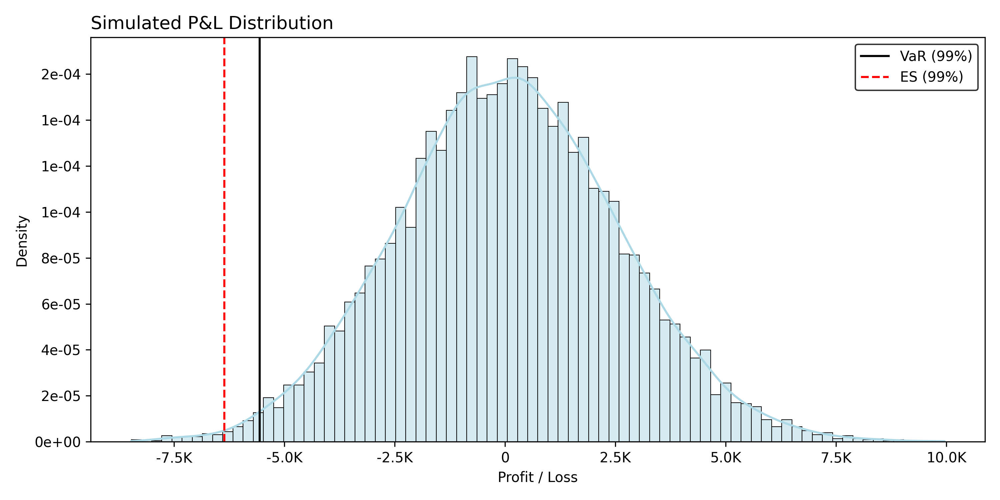

In [56]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_garch,
    var=var_garch,
    es=es_garch,
    confidence_level=confidence_level
)


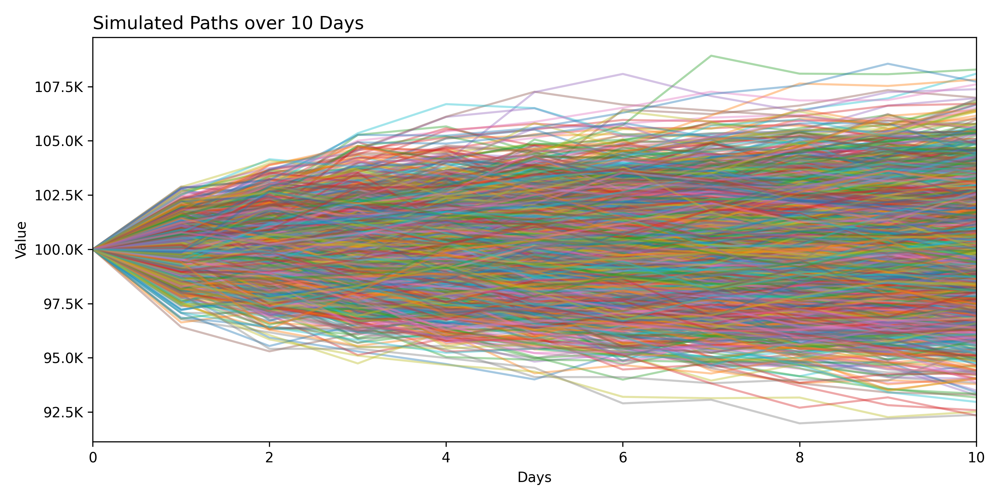

In [57]:
pv.plot_simulated_paths(paths_garch)

In [58]:
# T-GARCH
var_tgarch, pnl_tgarch, paths_tgarch = pv.multiday_garch_simulation_var_univariate(
    price_series=sp_data["Close"],
    forecast_days=forecast_days,
    n_samples=n_samples,
    confidence_level=confidence_level,
    seed=1,
    wealth=wealth,
    distribution="t"
)

# Calculate ES
es_tgarch = pv.simulation_es(var_tgarch, pnl_tgarch)

# Print results
print(f"T-GARCH VaR ({int(confidence_level * 100)}%):  {var_tgarch:,.2f} USD")
print(f"T-GARCH ES  ({int(confidence_level * 100)}%):  {es_tgarch:,.2f} USD")

T-GARCH VaR (99%):  5,991.87 USD
T-GARCH ES  (99%):  6,972.15 USD



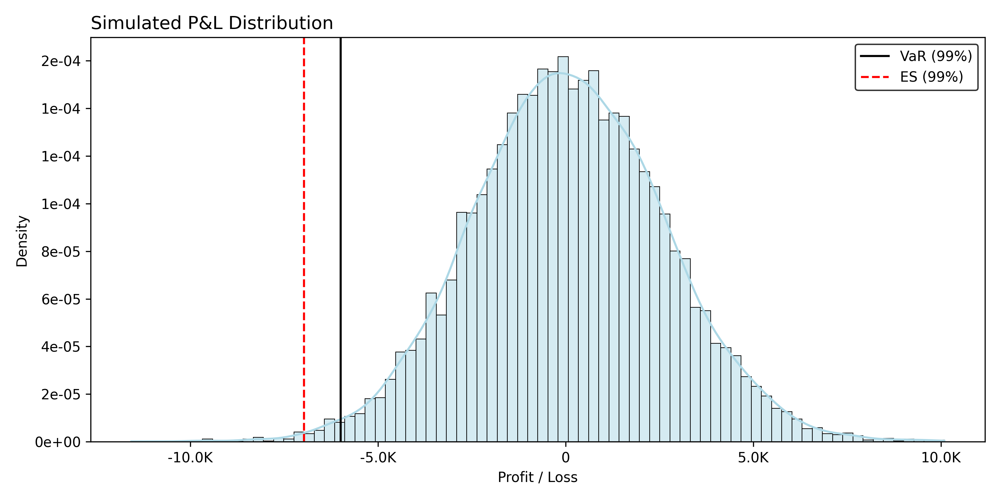

In [ ]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_tgarch,
    var=var_tgarch,
    es=es_tgarch,
    confidence_level=confidence_level
)


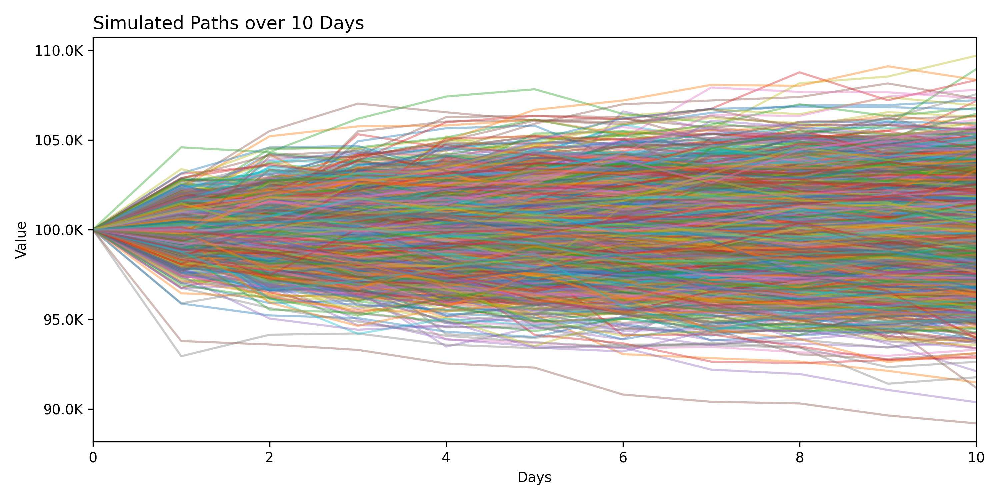

In [ ]:
pv.plot_simulated_paths(paths_tgarch)

#### Comparing GARCH vs T-GARCH Simulations

In this example, the **T-GARCH** model produces a **slightly higher VaR** estimate than the standard GARCH(1,1) for a **10-day ahead forecast**, reflecting **fatter tails** in the simulated return distribution.

This result stems from the **standardized t-distribution** used for the model’s innovations, which introduces **heavier tails** compared to the Gaussian assumption in standard GARCH. As a result, the T-GARCH model allows for more extreme return realizations, especially in the tails.

However, this difference is **not always persistent**. The relative VaR between GARCH and T-GARCH depends on:
- The **forecast horizon** — over longer horizons, tail differences compound more significantly; over short horizons, the effect may be minimal.
- The **fit of the innovation distribution** — the t-distribution may better capture kurtosis, reducing under- or overestimation of tail risk.
- The **volatility path** — since both models assume symmetric response to shocks, recent return asymmetry does not affect volatility forecasts directly.

Thus, while T-GARCH often yields **fatter tails and higher VaR**, especially for multi-day horizons, it can also lead to **tighter, more accurate tail estimates** if the data favors the t-distribution over normality.

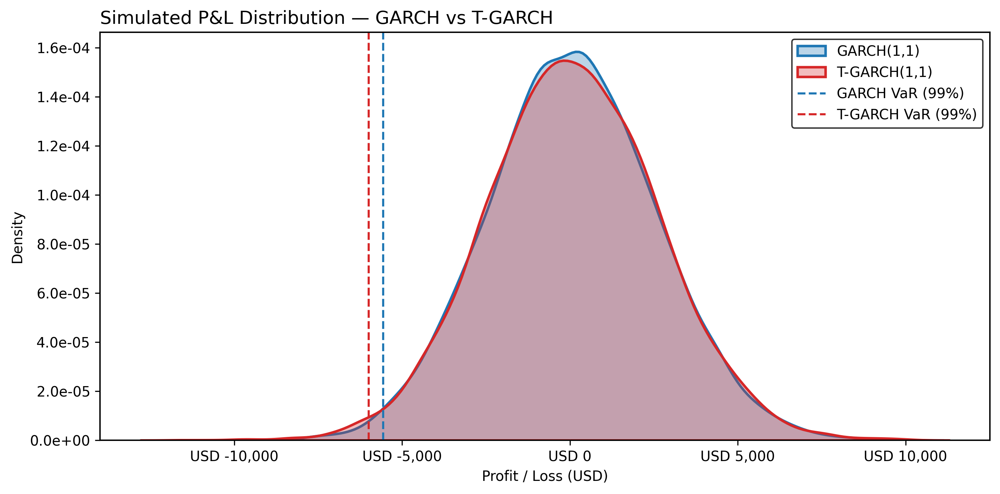

In [ ]:
# Plot
plt.figure(figsize=(10, 5), dpi=300)

# KDEs
sns.kdeplot(pnl_garch, label="GARCH(1,1)", fill=True, color="#1f77b4", linewidth=1.8, alpha=0.3)
sns.kdeplot(pnl_tgarch, label="T-GARCH(1,1)", fill=True, color="#d62728", linewidth=1.8, alpha=0.3)

# VaR lines
plt.axvline(-var_garch, color="#1f77b4", linestyle="--", linewidth=1.5, label="GARCH VaR (99%)")
plt.axvline(-var_tgarch, color="#d62728", linestyle="--", linewidth=1.5, label="T-GARCH VaR (99%)")

# Title and labels
plt.title("Simulated P&L Distribution — GARCH vs T-GARCH", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Profit / Loss (USD)" if wealth else "Profit / Loss (%)")
plt.ylabel("Density")

# Axes styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')

# Formatters
if wealth:
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"USD {x:,.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1e}"))

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()